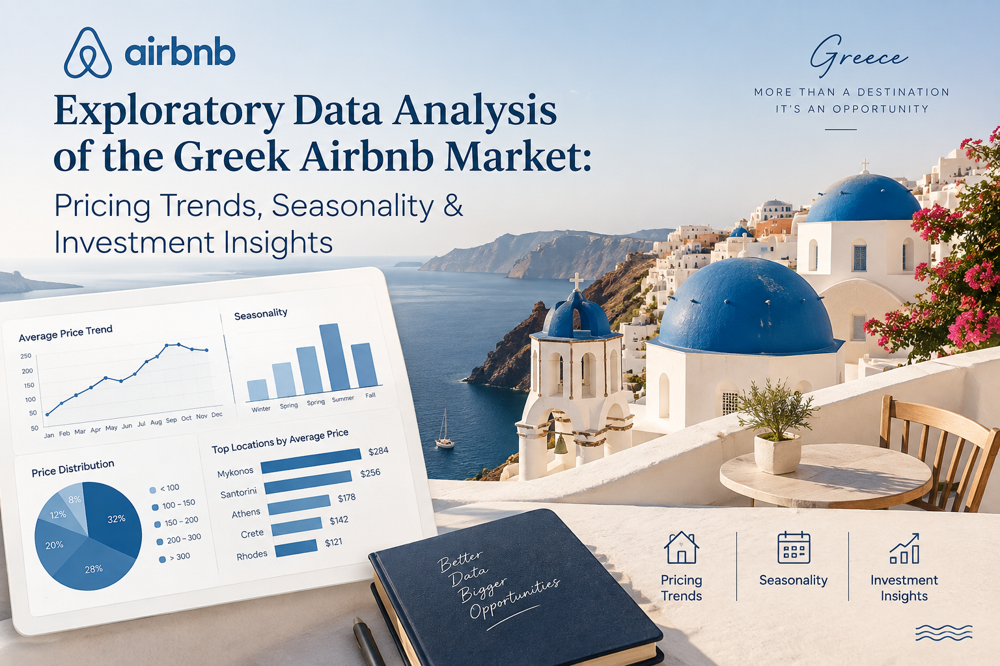

In [2]:
from IPython.display import Image, display

display(Image(filename=r'C:\Users\Noor\OneDrive\Desktop\GA - NOOR\project 2\greece_pic.png', width=1000))

####  Import libraries

In [58]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

####  Load the dataset

In [4]:
df_Athens=pd.read_csv(r"C:\Users\Noor\OneDrive\Desktop\GA - NOOR\project 2\listings_Athens.csv")
df_Crete=pd.read_csv(r"C:\Users\Noor\OneDrive\Desktop\GA - NOOR\project 2\listings_Crete.csv")
df_SouthAegean=pd.read_csv(r"C:\Users\Noor\OneDrive\Desktop\GA - NOOR\project 2\listings_South Aegean.csv")
df_Thessaloniki=pd.read_csv(r"C:\Users\Noor\OneDrive\Desktop\GA - NOOR\project 2\listings_Thessaloniki.csv")

In [5]:
### check that all the date have the same columns
print(f'Athens {df_Athens.shape}')
print(f'Crete {df_Crete.shape}')
print(f'South Aegean {df_SouthAegean.shape}')
print(f'Thessaloniki {df_Thessaloniki.shape}')

Athens (14337, 90)
Crete (27333, 90)
South Aegean (36680, 90)
Thessaloniki (4965, 90)


In [6]:
## merge the date 
df_Greece=pd.concat([df_Athens , df_Crete , df_SouthAegean , df_Thessaloniki] , ignore_index=True)

In [7]:
# Save only the columns we actually need for the analysis into their own dataframe.
# Dropped: URLs/pictures/scrape metadata, and columns that are 100% empty in this

selected_columns = [
    'id', 
    'host_is_superhost', 
    'neighbourhood_cleansed', 
    'room_type',
    'latitude', 
    'longitude',
    'property_type', 
    'accommodates',
    'bathrooms', 
    'bedrooms', 
    'beds',
    'price', 
    'availability_365',
    'number_of_reviews', 
    'estimated_occupancy_l365d', 
    'estimated_revenue_l365d',
    'first_review', 
    'last_review', 
    'review_scores_rating', 
]

In [8]:
select_data = df_Greece[selected_columns].copy()

# From this point on, we work only with the selected columns
df_Greece = select_data

In [9]:
# One row = one Airbnb listing in Greece (id, host info, location, room/property
# type, pricing, availability, reviews and estimated revenue for that listing).

print(f"Rows: {df_Greece.shape[0]}, Columns: {df_Greece.shape[1]}")
df_Greece.head(3)


Rows: 83315, Columns: 19


,id,host_is_superhost,neighbourhood_cleansed,room_type,latitude,longitude,property_type,accommodates,bathrooms,bedrooms,beds,price,availability_365,number_of_reviews,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating
0,1688956109252030943,f,ΠΛΑΤΕΙΑ ΑΜΕΡΙΚΗΣ,Private room,38.002810,23.730280,Private room in rental unit,2,1.0,1.0,1.0,$50.21,364,1,6,301.0,2026-06-24,2026-06-24,3.0
1,1313583187264905878,f,ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ,Entire home/apt,37.989563,23.734202,Entire rental unit,4,2.0,2.0,3.0,"$1,712.00",179,0,0,0.0,NaN,NaN,NaN
2,1476016783470539102,f,ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ,Entire home/apt,37.987185,23.731392,Entire rental unit,4,1.0,1.0,1.0,$116.00,363,0,0,0.0,NaN,NaN,NaN


In [10]:
# Multiple columns need type conversion before we can analyze them:

# 1 -  price -> stored as text with $ and commas -> numeric and filling by proprty groubed price
# 2 - 1 boolean columns (t/f) -> stored as text -> real True/False
# 3 - 2 date columns -> stored as text -> datetime

In [11]:
df_Greece.info()

<class 'pandas.DataFrame'>
RangeIndex: 83315 entries, 0 to 83314
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         83315 non-null  int64  
 1   host_is_superhost          83315 non-null  str    
 2   neighbourhood_cleansed     83315 non-null  str    
 3   room_type                  83315 non-null  str    
 4   latitude                   83315 non-null  float64
 5   longitude                  83315 non-null  float64
 6   property_type              83315 non-null  str    
 7   accommodates               83315 non-null  int64  
 8   bathrooms                  74941 non-null  float64
 9   bedrooms                   77294 non-null  float64
 10  beds                       77338 non-null  float64
 11  price                      78783 non-null  str    
 12  availability_365           83315 non-null  int64  
 13  number_of_reviews          83315 non-null  int64  
 14  e

In [12]:
df_Greece.dtypes

id                             int64
host_is_superhost                str
neighbourhood_cleansed           str
room_type                        str
latitude                     float64
longitude                    float64
property_type                    str
accommodates                   int64
bathrooms                    float64
bedrooms                     float64
beds                         float64
price                            str
availability_365               int64
number_of_reviews              int64
estimated_occupancy_l365d      int64
estimated_revenue_l365d      float64
first_review                     str
last_review                      str
review_scores_rating         float64
dtype: object

**Convert** data to proper type

In [13]:
# Numeric: price fields
df_Greece['price'] = (
    df_Greece['price']
    .astype(str)
    .str.replace(r'[\$,]', '', regex=True)
)

# Restore original NaN values (astype(str) turns them into the string "nan")
df_Greece.loc[df_Greece['price'] == 'nan', 'price'] = pd.NA
df_Greece['price'] = pd.to_numeric(df_Greece['price'], errors='coerce')

# review dates are stored as text -> convert to datetime
df_Greece['first_review'] = pd.to_datetime(df_Greece['first_review'], errors='coerce')
df_Greece['last_review'] = pd.to_datetime(df_Greece['last_review'], errors='coerce')

# Convert host_is_superhost from 't'/'f' to 'Yes'/'No'
df_Greece['host_is_superhost'] = df_Greece['host_is_superhost'].map({'t': 'Yes', 'f': 'No'})


df_Greece[['price', 'first_review', 'last_review','host_is_superhost']].dtypes


price                       float64
first_review         datetime64[us]
last_review          datetime64[us]
host_is_superhost               str
dtype: object

### Check missing values

In [14]:
missing_count = df_Greece.isnull().sum()
missing_pct = (missing_count / len(df_Greece) * 100).round(2)

missing_summary = pd.DataFrame({
    'missing_count': missing_count,
    'missing_pct': missing_pct
})
missing_summary = missing_summary[missing_summary['missing_count'] > 0].sort_values('missing_pct', ascending=False)
missing_summary

,missing_count,missing_pct
last_review,16472,19.77
review_scores_rating,16472,19.77
first_review,16472,19.77
bathrooms,8374,10.05
bedrooms,6021,7.23
beds,5977,7.17
price,4532,5.44
estimated_revenue_l365d,4532,5.44


### Check duplicates and uniqueness

In [15]:
# No duplicate rows or ids -> each row is a unique listing.
print("Fully duplicated rows:", df_Greece.duplicated().sum())
print("Duplicated listing ids:", df_Greece['id'].duplicated().sum())

Fully duplicated rows: 0
Duplicated listing ids: 0


###  Clean obvious data-quality issues

In [16]:
# 1) Structural numeric gaps (bedrooms, beds): impute with the median for
#    that property_type, since a studio and a villa shouldn't share one median
for c in ['bedrooms', 'beds', 'bathrooms']:
    df_Greece[c] = df_Greece.groupby('property_type')[c].transform(lambda s: s.fillna(s.median()))
    df_Greece[c] = df_Greece[c].fillna(df_Greece[c].median())  # fallback for rare property types

In [17]:
# 2) Handle null values in the "price" column
# Approach: group by property_type, get the mean price per group,
# then fill each null price with the mean price of its own property_type group

# Check how many nulls we have first
print("Null prices before:", df_Greece["price"].isnull().sum())

# Compute mean price per property_type
mean_price_by_property = df_Greece.groupby("property_type")["price"].transform("mean")

# Fill nulls using the group mean
df_Greece["price"] = df_Greece["price"].fillna(mean_price_by_property)

# Just in case a property_type itself has no price data at all ,
# fall back to the overall mean price
df_Greece["price"] = df_Greece["price"].fillna(df_Greece["price"].mean())

print("Null prices after:", df_Greece["price"].isnull().sum())

Null prices before: 4532
Null prices after: 0


In [18]:
df_Greece.columns

Index(['id', 'host_is_superhost', 'neighbourhood_cleansed', 'room_type',
       'latitude', 'longitude', 'property_type', 'accommodates', 'bathrooms',
       'bedrooms', 'beds', 'price', 'availability_365', 'number_of_reviews',
       'estimated_occupancy_l365d', 'estimated_revenue_l365d', 'first_review',
       'last_review', 'review_scores_rating'],
      dtype='str')

In [19]:
# 3)these review-related columns are missing because the listing has no reviews
# yet (not because of bad data) -> fill with 0 instead of "Unknown"
review_fill_columns = ['review_scores_rating']
df_Greece[review_fill_columns] = df_Greece[review_fill_columns].fillna(0)

# reviews genuinely has no review date - there is no meaningful "0" date

print("Remaining missing values in review score column:", df_Greece[review_fill_columns].isnull().sum().sum())

Remaining missing values in review score column: 0


In [20]:
#4) fill only the missing spots in estimated_revenue_l365d using price x occupancy
df_Greece['estimated_revenue_l365d'] = df_Greece['estimated_revenue_l365d'].fillna(df_Greece['price'] * df_Greece['estimated_occupancy_l365d'])

after= df_Greece['estimated_revenue_l365d'].isnull().sum()
after

np.int64(0)

In [21]:
#5)Round up bathroom values that contain ".5" to the next whole number
#  0.5 -> 1, 1.5 -> 2, 2.5 -> 3

import numpy as np

print("Before:", df_Greece["bathrooms"].unique())

df_Greece["bathrooms"] = np.ceil(df_Greece["bathrooms"])

print("After:", df_Greece["bathrooms"].unique())

Before: [ 1.    2.    1.5   3.    4.    3.5   2.5   0.5   4.5   6.    5.    8.
  7.    5.5   6.5  11.    9.    8.5   7.5  17.5  13.5  10.    9.5  12.
 16.   17.   10.5  14.   20.   15.   13.   18.5  18.   19.   21.   22.
 23.    1.25 26.   33.   19.5  11.5  28.  ]
After: [ 1.  2.  3.  4.  5.  6.  8.  7. 11.  9. 18. 14. 10. 12. 16. 17. 20. 15.
 13. 19. 21. 22. 23. 26. 33. 28.]


In [22]:
missing_count = df_Greece.isnull().sum()
missing_pct = (missing_count / len(df_Greece) * 100).round(2)

missing_summary = pd.DataFrame({
    'missing_count': missing_count,
    'missing_pct': missing_pct
})
missing_summary = missing_summary[missing_summary['missing_count'] > 0].sort_values('missing_pct', ascending=False)
missing_summary

,missing_count,missing_pct
first_review,16472,19.77
last_review,16472,19.77


In [23]:
### we cant fill the missing date so i left it as it is

####  Descriptive statistics

In [24]:
df_Greece.describe().T

,count,mean,min,25%,50%,75%,max,std
id,83315.0,734902440172781184.0,13131.0,38792342.5,859787256552528768.0,1314521688677924864.0,1718200815190089984.0,631960076655315968.0
latitude,83315.0,36.785387,34.83468,35.50133,36.724384,37.607328,40.687666,1.385777
longitude,83315.0,24.923349,22.889456,23.761471,24.906095,25.396755,29.598944,1.305646
accommodates,83315.0,4.408738,1.0,2.0,4.0,5.0,16.0,2.586963
bathrooms,83315.0,1.566261,1.0,1.0,1.0,2.0,33.0,1.228688
bedrooms,83315.0,1.824605,0.0,1.0,1.0,2.0,37.0,1.333771
beds,83315.0,2.700834,1.0,1.0,2.0,3.0,71.0,1.95873
price,83315.0,300.647439,2.77,102.25,153.5,295.0,106942.0,742.135844
availability_365,83315.0,189.461934,0.0,82.0,180.0,303.0,365.0,116.561337
number_of_reviews,83315.0,31.955182,0.0,1.0,9.0,34.0,2456.0,64.638217


In [25]:
df_Greece.describe(include='object').T

C:\Users\Noor\AppData\Local\Temp\ipykernel_7660\1292568454.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  df_Greece.describe(include='object').T


,count,unique,top,freq
host_is_superhost,83315,2,No,47853
neighbourhood_cleansed,83315,109,Θήρας (Santorini),6198
room_type,83315,4,Entire home/apt,74051
property_type,83315,97,Entire rental unit,30437


**Key observations:**
- Median price ≈ 152$/night, but the mean (299$) is far higher and the max (106,942$) is extreme → price is heavily right-skewed with outliers.

- Typical listing sleeps 4, has 1 bedroom(s) and 1 bathroom(s).

### Explore categorical variables

In [26]:
categorical_cols = df_Greece.select_dtypes(include='object')

C:\Users\Noor\AppData\Local\Temp\ipykernel_7660\1423162807.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  categorical_cols = df_Greece.select_dtypes(include='object')


In [27]:
## Visualize the categorical columns

for col in categorical_cols:

    value_counts = (
        df_Greece[col]
        .value_counts()
        .head(12)
        .reset_index()
    )

    value_counts.columns = [col, "Count"]

    fig = px.bar(
        value_counts,
        x=col,
        y="Count",
        text_auto=True,
        title=f"{col.title()} - Frequency Distribution"
    )

    fig.show()

### Explore numerical distributions

Histograms help identify skewness, concentration, and unusual values.


In [28]:
numbers = df_Greece.select_dtypes(include='number').columns.drop(['id','latitude','longitude'])

In [29]:
## Visualize the numerical columns
for col in numbers:

    fig = px.histogram(df_Greece,x=col,
        nbins=30,
        title=f"Distribution of {col.title()}",
        labels={
            col: col.title(),
            "count": "Frequency"
        })

    fig.show()

**Key observations:**
- `price` and `estimated_revenue_l365d`  are the most skewed — a small number of very expensive listings / power hosts pull the mean far above the median.

- `availability_l365d` show a bimodal pattern — many listings are either almost always booked out or almost always open, few sit in the middle.

### Detect outliers using IQR

The common IQR rule defines potential outliers as values below:

`Q1 - 1.5 × IQR`

or above:

`Q3 + 1.5 × IQR`

In [30]:
outlier_summary = {}

for col in numbers:
    Q1 = df_Greece[col].quantile(0.25)
    Q3 = df_Greece[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    col_outliers = df_Greece[(df_Greece[col] < lower) | (df_Greece[col] > upper)]
    outlier_summary[col] = {
        'lower_bound': lower,
        'upper_bound': upper,
        'n_outliers': len(col_outliers),
        'pct_outliers': round(len(col_outliers) / df_Greece[col].notna().sum() * 100, 2)
    }


outlier_df = pd.DataFrame(outlier_summary).T.sort_values('pct_outliers', ascending=False)
outlier_df

,lower_bound,upper_bound,n_outliers,pct_outliers
review_scores_rating,3.600,5.840,17266.0,20.72
number_of_reviews,-48.500,83.500,8586.0,10.31
price,-186.875,584.125,8184.0,9.82
estimated_revenue_l365d,-12390.000,20650.000,7498.0,9.00
estimated_occupancy_l365d,-72.000,120.000,7123.0,8.55
bedrooms,-0.500,3.500,7047.0,8.46
bathrooms,-0.500,3.500,4810.0,5.77
accommodates,-2.500,9.500,4524.0,5.43
beds,-2.000,6.000,3239.0,3.89
availability_365,-249.500,634.500,0.0,0.00


**Key observations:**
- `price` alone has ~6212 outliers (9.29% of rows) — mostly extreme luxury listings, but a few (like the 106,942$/night one) look like **data-entry errors** rather than real prices.

- `estimated_revenue_l365d` also carry heavy outliers, consistent with the skew seen in Step 9.

- We keep these rows (don't drop them) since they're real business signal (luxury villas, power hosts) — just be aware they'll distort means, so prefer the median for headline stats.


### Visualize outliers with a box plot

In [31]:
for col in numbers:
    fig = px.box(
        df_Greece,
        y=col,
        title=f"Box Plot: {col.title()}"
    )

    fig.show()

### Analyze relationships between numerical variables

 use correlation


In [32]:
# Focus on the numeric variables most relevant to the business questions
key_numeric = [
    'price', 'accommodates', 'bedrooms', 'bathrooms', 'beds',
    'availability_365', 'review_scores_rating',
    'estimated_revenue_l365d', 'estimated_occupancy_l365d'
]

corr_matrix = df_Greece[key_numeric].corr(numeric_only=True)

fig = px.imshow(
    corr_matrix,
    text_auto=".2f",
    color_continuous_scale="RdBu_r",
    zmin=-1, zmax=1,
    title="Correlation Heatmap - Key Numeric Variables"
)
fig.show()

corr_matrix

,price,accommodates,bedrooms,bathrooms,beds,availability_365,review_scores_rating,estimated_revenue_l365d,estimated_occupancy_l365d
price,1.000000,0.409846,0.503378,0.525144,0.373708,-0.020930,-0.143362,0.292654,-0.101793
accommodates,0.409846,1.000000,0.868945,0.749517,0.815773,-0.030577,-0.071921,0.176302,-0.109301
bedrooms,0.503378,0.868945,1.000000,0.827679,0.802850,-0.043012,-0.079122,0.164828,-0.110673
bathrooms,0.525144,0.749517,0.827679,1.000000,0.698420,-0.031776,-0.096934,0.165129,-0.107565
beds,0.373708,0.815773,0.802850,0.698420,1.000000,-0.035254,-0.033270,0.145689,-0.108365
availability_365,-0.020930,-0.030577,-0.043012,-0.031776,-0.035254,1.000000,-0.073167,-0.029553,0.061159
review_scores_rating,-0.143362,-0.071921,-0.079122,-0.096934,-0.033270,-0.073167,1.000000,0.246652,0.334176
estimated_revenue_l365d,0.292654,0.176302,0.164828,0.165129,0.145689,-0.029553,0.246652,1.000000,0.550028
estimated_occupancy_l365d,-0.101793,-0.109301,-0.110673,-0.107565,-0.108365,0.061159,0.334176,0.550028,1.000000


In [33]:
key_numeric_2 = [
    'price', 
    'review_scores_rating',
    'estimated_revenue_l365d', 
    'estimated_occupancy_l365d'
]

fig = px.scatter_matrix(
    df_Greece,
    dimensions=key_numeric_2,
    title="Scatter Matrix of Key Numeric Variables"
)

fig.show()

### Compare performance across groups

use Groupby

In [34]:
region_summary = (
    df_Greece.groupby('neighbourhood_cleansed')
    .agg(listings=('id', 'count'),
         avg_price=('price', 'mean'),
         avg_rating=('review_scores_rating', 'mean'),
         total_estimated_revenue=('estimated_revenue_l365d', 'sum'))
    .sort_values('total_estimated_revenue', ascending=False)
)
region_summary.head(5)

,listings,avg_price,avg_rating,total_estimated_revenue
neighbourhood_cleansed,,,,
Θήρας (Santorini),6198,386.936233,3.512780,5.344776e+07
Χανίων,6132,258.350315,4.127422,4.712377e+07
Μυκόνου (Μykonos),4014,1076.220748,3.337765,3.847890e+07
Ρόδου (Rhodes),5980,285.149519,3.777619,3.658291e+07
Πάρου (Paros),3887,481.266803,3.860808,3.513319e+07


In [35]:
top_regions = region_summary.head(5).reset_index()

fig = px.bar(
    top_regions,
    x='neighbourhood_cleansed',
    y='total_estimated_revenue',
    text_auto='.2s',
    title="Top 5 Neighbourhoods by Estimated Annual Revenue"
)
fig.show()

In [36]:
category_summary = (
    df_Greece.groupby('room_type')
    .agg(listings=('id', 'count'),
         avg_price=('price', 'mean'),
         avg_revenue=('estimated_revenue_l365d', 'mean'),
         avg_rating=('review_scores_rating', 'mean'))
    .sort_values('avg_revenue', ascending=False)
)
category_summary

,listings,avg_price,avg_revenue,avg_rating
room_type,,,,
Entire home/apt,74051,312.516904,7555.611585,3.960201
Hotel room,679,244.939426,3261.416788,3.776186
Private room,8516,203.969471,2535.402930,3.099805
Shared room,69,42.525983,1127.131117,3.601594


In [37]:
property_summary = (
    df_Greece.groupby('property_type')
    .agg(listings=('id', 'count'), avg_price=('price', 'mean'))
    .sort_values('listings', ascending=False)
    .head(10)
)
property_summary

,listings,avg_price
property_type,,
Entire rental unit,30437,152.188596
Entire home,13478,364.679531
Entire villa,10526,836.574012
Entire condo,7475,137.720928
Cycladic home,6535,357.100433
Room in hotel,3239,224.994760
Private room in rental unit,1773,141.702397
Entire serviced apartment,1518,203.441589
Room in boutique hotel,1083,279.344639


In [38]:
superhost_summary = (
    df_Greece.groupby('host_is_superhost')
    .agg(avg_rating=('review_scores_rating', 'mean'),
         avg_price=('price', 'mean'),
         avg_reviews=('number_of_reviews', 'mean'),
         listings=('id', 'count'))
)
superhost_summary

,avg_rating,avg_price,avg_reviews,listings
host_is_superhost,,,,
No,3.525691,280.558177,18.311496,47853
Yes,4.335695,327.756216,50.366195,35462


### Time-series EDA

In [39]:
reviews_ts = df_Greece.dropna(subset=['first_review']).copy()
reviews_ts['review_month'] = reviews_ts['first_review'].dt.to_period('M').astype(str)

monthly_new_listings = (
    reviews_ts.groupby('review_month')
    .size()
    .reset_index(name='new_listings_with_review')
)
monthly_new_listings.tail(12)

,review_month,new_listings_with_review
166,2025-08,1957
167,2025-09,987
168,2025-10,531
169,2025-11,251
170,2025-12,278
171,2026-01,233
172,2026-02,266
173,2026-03,404
174,2026-04,797
175,2026-05,1316


In [40]:
fig = px.line(
    monthly_new_listings,
    x='review_month',
    y='new_listings_with_review',
    title="Listings by Month of First Review (Trend Over Time)",
    markers=True
)
fig.show()

### Find the best and worst performers

A useful EDA habit is to inspect both extremes rather than only averages.

In [41]:
print("Top 5 listings by estimated annual revenue:")
display(df_Greece.nlargest(5, 'estimated_revenue_l365d')[
    ['neighbourhood_cleansed', 'room_type', 'price', 'estimated_revenue_l365d']
])

print("\nBottom 5 rated listings (with at least 1 review):")
display(df_Greece[df_Greece['number_of_reviews'] > 0].nsmallest(5, 'review_scores_rating')[
    ['neighbourhood_cleansed', 'room_type', 'review_scores_rating']
])

Top 5 listings by estimated annual revenue:


,neighbourhood_cleansed,room_type,price,estimated_revenue_l365d
65701,Θήρας (Santorini),Entire home/apt,106942.0,1924956.0
49760,Θήρας (Santorini),Entire home/apt,1056.0,269280.0
33194,Μυλοποτάμου,Entire home/apt,2610.0,266220.0
5094,ΑΚΡΟΠΟΛΗ,Entire home/apt,1029.0,262395.0
18175,Αποκορώνου,Entire home/apt,1186.0,260920.0



Bottom 5 rated listings (with at least 1 review):


,neighbourhood_cleansed,room_type,review_scores_rating
52,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,Private room,1.0
320,ΠΛΑΤΕΙΑ ΑΜΕΡΙΚΗΣ,Private room,1.0
356,ΠΛΑΤΕΙΑ ΑΤΤΙΚΗΣ,Entire home/apt,1.0
365,ΝΕΟΣ ΚΟΣΜΟΣ,Entire home/apt,1.0
559,ΓΚΥΖΗ,Entire home/apt,1.0


---

# Deep Dive — Interesting Patterns


In [42]:
fig = px.density_mapbox(
    df_Greece, lat='latitude', lon='longitude',
    radius=3, zoom=5, height=600,
    title="Airbnb Listings Density - Greece"
)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

C:\Users\Noor\AppData\Local\Temp\ipykernel_7660\2036065968.py:1: DeprecationWarning: *density_mapbox* is deprecated! Use *density_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.density_mapbox(


Does a higher price actually mean higher revenue?

 Split listings into price deciles and compare average estimated revenue
and average occupancy across them.

In [43]:
price_valid = df_Greece.dropna(subset=['price', 'estimated_revenue_l365d']).copy()
price_valid = price_valid[price_valid['price'] > 0]
price_valid['price_decile'] = pd.qcut(price_valid['price'], 10, duplicates='drop')

price_vs_revenue = (
    price_valid.groupby('price_decile', observed=True)
    .agg(listings=('id', 'count'),
         avg_price=('price', 'mean'),
         avg_revenue=('estimated_revenue_l365d', 'mean'),
         avg_occupancy=('estimated_occupancy_l365d', 'mean'))
)
price_vs_revenue

,listings,avg_price,avg_revenue,avg_occupancy
price_decile,,,,
"(2.769, 74.18]",8350,59.844863,4028.982880,68.338323
"(74.18, 93.0]",8531,84.017996,4371.045093,52.259290
"(93.0, 111.5]",8152,102.366376,4630.075697,45.316977
"(111.5, 133.25]",8298,121.736021,4812.681227,39.587611
"(133.25, 153.5]",8332,144.593045,4617.053848,32.140783
"(153.5, 190.5]",8333,170.909968,6229.998089,36.497540
"(190.5, 248.5]",8327,217.262494,7114.722588,32.797766
"(248.5, 357.1]",8398,299.367885,8754.787340,29.511669
"(357.1, 577.718]",8262,442.086566,11011.906663,24.800896


In [66]:
#Objective 1: Price vs. Occupancy and Revenue 
bins = [0, 75, 100, 150, 250, 500, df_Greece['price'].max()]
labels = ['<75', '75-100', '100-150', '150-250', '250-500', '500+']
df_Greece['price_bucket'] = pd.cut(df_Greece['price'], bins=bins, labels=labels, include_lowest=True)

price_summary = (df_Greece.groupby('price_bucket', observed=True).agg(avg_occupancy=('estimated_occupancy_l365d', 'mean'),
         avg_revenue=('estimated_revenue_l365d', 'mean')).reset_index())

fig1 = go.Figure()

fig1.add_trace(go.Scatter(x=price_summary['price_bucket'], y=price_summary['avg_occupancy'],name='Avg Occupancy (nights)', 
                          mode='lines+markers',line=dict(color='blue'), yaxis='y1'))

fig1.add_trace(go.Scatter(x=price_summary['price_bucket'], y=price_summary['avg_revenue'],name='Avg Revenue (€)', 
                          mode='lines+markers',line=dict(color='orange'), yaxis='y2'))

fig1.update_layout(title='Objective 1: Price vs. Occupancy and Revenue ',
    xaxis=dict(title='Price Range ($)'),
    yaxis=dict(title=dict(text='Avg Occupancy (nights)', font=dict(color='blue')),tickfont=dict(color='blue')),
    yaxis2=dict(title=dict(text='Avg Revenue ($)', font=dict(color='orange')),tickfont=dict(color='orange'),overlaying='y', side='right'),
    legend=dict(x=0.02, y=1.1, orientation='h'))

In [ ]:
#Objective 2: Rating vs. Occupancy and Revenue
bins = [0, 3, 3.5, 4, 4.5, 4.8, 5]
labels = ['<3', '3-3.5', '3.5-4', '4-4.5', '4.5-4.8', '4.8-5']
df_Greece['rating_bucket'] = pd.cut(df_Greece['review_scores_rating'], bins=bins, labels=labels, include_lowest=True)

rating_summary = (df_Greece.groupby('rating_bucket', observed=True)
                  .agg(avg_occupancy=('estimated_occupancy_l365d', 'mean'),
                  avg_revenue=('estimated_revenue_l365d', 'mean')).reset_index())

fig2 = go.Figure()

fig2.add_trace(go.Scatter(x=rating_summary['rating_bucket'], y=rating_summary['avg_occupancy'],name='Avg Occupancy (nights)', 
                          mode='lines',line=dict(color='blue'), yaxis='y1'))

fig2.add_trace(go.Scatter(x=rating_summary['rating_bucket'], y=rating_summary['avg_revenue'],name='Avg Revenue ($)', 
                          mode='lines',line=dict(color='orange'), yaxis='y2'))

fig2.update_layout(title='Objective 2: Rating vs. Occupancy and Revenue',
    xaxis=dict(title='Review Rating Range'),
    yaxis=dict(title=dict(text='Avg Occupancy (nights)', font=dict(color='blue')),tickfont=dict(color='blue')),
    yaxis2=dict(title=dict(text='Avg Revenue ($)', font=dict(color='orange')),tickfont=dict(color='orange'),
        overlaying='y', side='right'),
    legend=dict(x=0.02, y=1.1, orientation='h')
)
fig2.show()

print(df_Greece.groupby('rating_bucket', observed=True)['price'].mean())

rating_bucket
<3         515.032839
3-3.5      167.876819
3.5-4      222.070163
4-4.5      184.677404
4.5-4.8    179.535709
4.8-5      269.247585
Name: price, dtype: float64


In [64]:
#Objective 3: Occupancy & Revenue by Price Range — Superhost vs Regular
bins = [0, 75, 100, 150, 250, 500, df_Greece['price'].max()]
labels = ['<75', '75-100', '100-150', '150-250', '250-500', '500+']
df_Greece['price_bucket'] = pd.cut(df_Greece['price'], bins=bins, labels=labels, include_lowest=True)

superhost_by_price = (
    df_Greece.groupby(['price_bucket', 'host_is_superhost'], observed=True)
        .agg(avg_occupancy=('estimated_occupancy_l365d', 'mean'),
         avg_revenue=('estimated_revenue_l365d', 'mean')).reset_index())


fig = make_subplots(rows=1, cols=2, subplot_titles=("Occupancy by Price Range", "Revenue by Price Range"))

colors = {'No': 'orange', 'Yes': 'blue'}   

for status in superhost_by_price['host_is_superhost'].unique():
    d = superhost_by_price[superhost_by_price['host_is_superhost'] == status]
    print(d)

    fig.add_trace(go.Bar(x=d['price_bucket'], y=d['avg_occupancy'],
        name=status, marker_color=colors[status],
        legendgroup=status, showlegend=True), row=1, col=1)

    fig.add_trace(go.Bar(x=d['price_bucket'], y=d['avg_revenue'],
        name=status, marker_color=colors[status],
        legendgroup=status, showlegend=False), row=1, col=2)

fig.update_layout(title_text='Objective 3: Occupancy & Revenue by Price Range — Superhost vs Regular',barmode='group',
    legend_title_text='Is Superhost')

fig.update_xaxes(title_text='Price Range ($)', row=1, col=1)
fig.update_xaxes(title_text='Price Range ($)', row=1, col=2)
fig.update_yaxes(title_text='Avg Occupancy (nights)', row=1, col=1)
fig.update_yaxes(title_text='Avg Revenue ($)', row=1, col=2)

fig.show()

   price_bucket host_is_superhost  avg_occupancy  avg_revenue
0           <75                No      47.903938  2764.804388
2        75-100                No      28.880911  2531.143554
4       100-150                No      20.088753  2457.641444
6       150-250                No      14.701524  2786.928773
8       250-500                No      12.349412  4258.292091
10         500+                No       8.451787  7638.275241
   price_bucket host_is_superhost  avg_occupancy   avg_revenue
1           <75               Yes      96.274613   5890.435116
3        75-100               Yes      78.531308   6877.066927
5       100-150               Yes      66.234079   8122.813680
7       150-250               Yes      60.201511  11429.010315
9       250-500               Yes      49.440980  17209.892951
11         500+               Yes      25.474423  20839.109164
